In [72]:
%load_ext autoreload
%reload_ext autoreload

%autoreload 2
%matplotlib inline
import tensorflow
from tensorflow.compat.v1.keras.backend import get_session
tensorflow.compat.v1.disable_v2_behavior()
import kerasAC 
from kerasAC.generators.tiledb_predict_generator import *
from kerasAC.tiledb_config import *
import tiledb 
from scipy.special import softmax
from kerasAC.interpret.deepshap import * 
from kerasAC.interpret.profile_shap import * 
from kerasAC.vis import * 

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [73]:
## for plotting 
import matplotlib 
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"]=10,5
plt.rcParams['axes.xmargin'] = 0

font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 10}

matplotlib.rc('font', **font)

In [74]:
gen=TiledbPredictGenerator(ref_fasta="/mnt/data/GRCh38_no_alt_analysis_set_GCA_000001405.15.fasta",
                    batch_size=1,
                    bed_regions_summit_center=True,
                    bed_regions="/srv/scratch/annashch/deeplearning/profile/k562_dnase/bpnet/interpret/regions_to_score.bed",
                    tdb_array="/srv/scratch/annashch/encode_dnase_tiledb/db/dnase",
                    tdb_partition_attribute_for_upsample="idr_peak",
                    chrom_sizes="/users/annashch/hg38.chrom.sizes",
                    tdb_partition_thresh_for_upsample=2,
                    tdb_input_flank=[673],
                    tdb_input_source_attribute=["seq"],
                    tdb_input_aggregation=[None],
                    tdb_input_transformation=[None],
                    tdb_output_source_attribute=["count_bigwig_unstranded_5p","count_bigwig_unstranded_5p"],
                    tdb_output_flank=[500,500],
                    tdb_output_aggregation=[None,"sum"],
                    tdb_output_transformation=[None,"log"],
                    num_inputs=1,
                    num_outputs=2,
                    upsample_ratio=None,
                    tasks=['ENCSR000EOT'],
                    tdb_ambig_attribute=None,
                    tdb_config=get_default_config(),
                    tdb_ctx=tiledb.Ctx(config=get_default_config()),
                    num_threads=1)
                    

opening:/srv/scratch/annashch/encode_dnase_tiledb/db/dnase for reading...
success!
got indices for used chroms
identified task indices:[2]
loaded bed regions
created generator
created predict generator


In [75]:
#load the model! 
from keras.models import load_model
from keras.utils.generic_utils import get_custom_objects
from kerasAC.metrics import * 
from kerasAC.custom_losses import * 
custom_objects={"recall":recall,
                    "sensitivity":recall,
                    "specificity":specificity,
                    "fpr":fpr,
                    "fnr":fnr,
                    "precision":precision,
                    "f1":f1,
                    "ambig_binary_crossentropy":ambig_binary_crossentropy,
                    "ambig_mean_absolute_error":ambig_mean_absolute_error,
                    "ambig_mean_squared_error":ambig_mean_squared_error,
                    "MultichannelMultinomialNLL":MultichannelMultinomialNLL}
get_custom_objects().update(custom_objects)


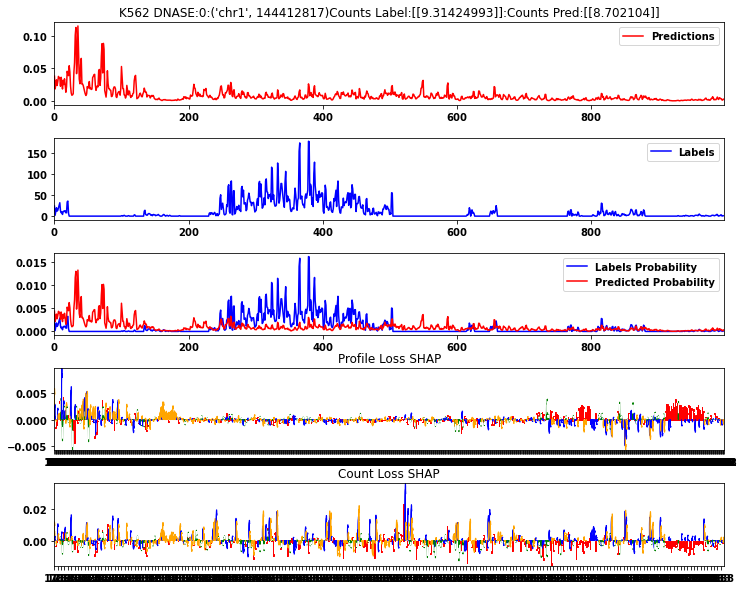

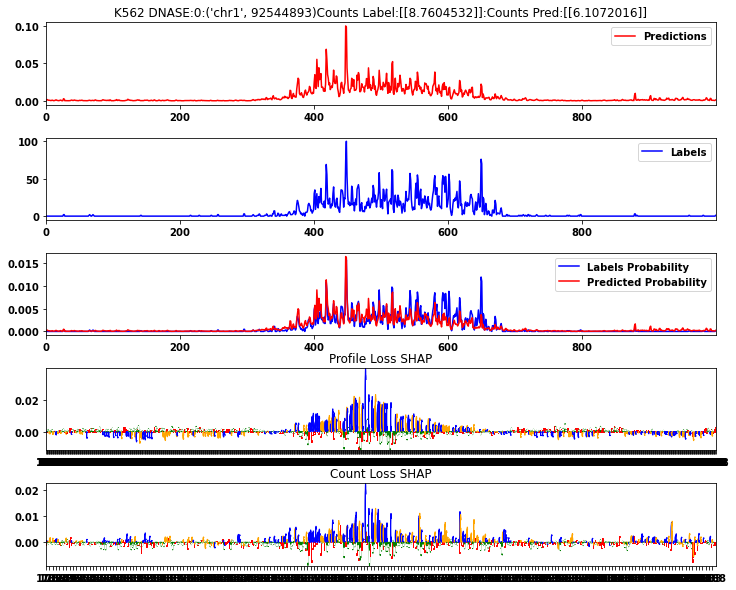

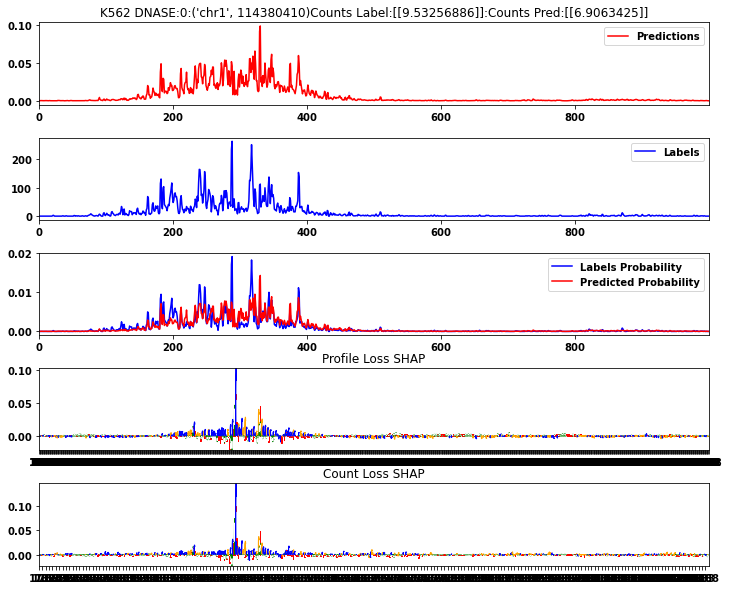

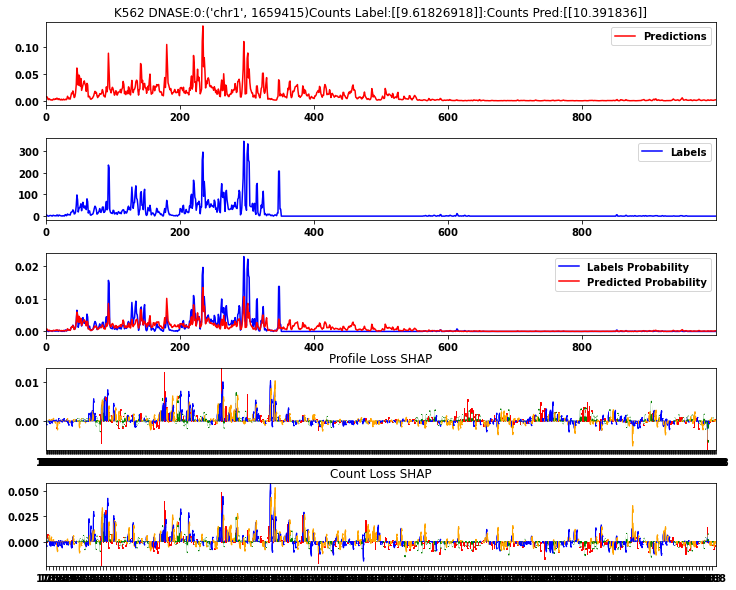

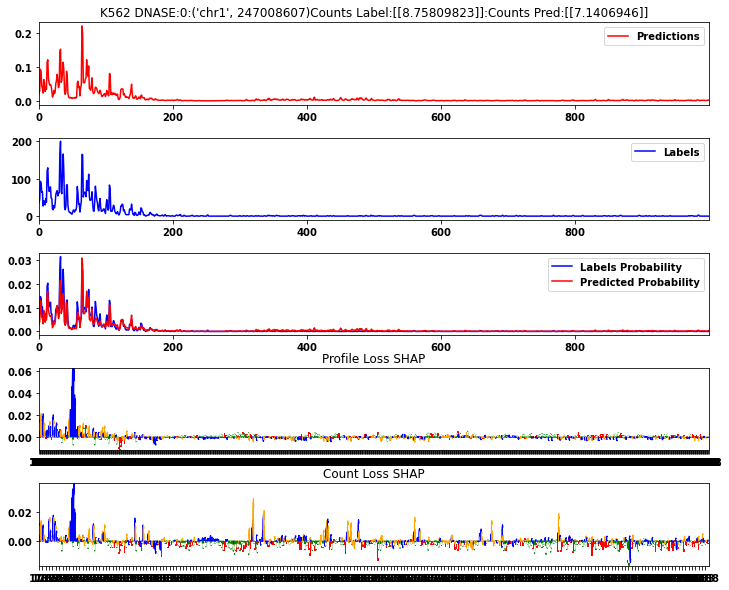

...

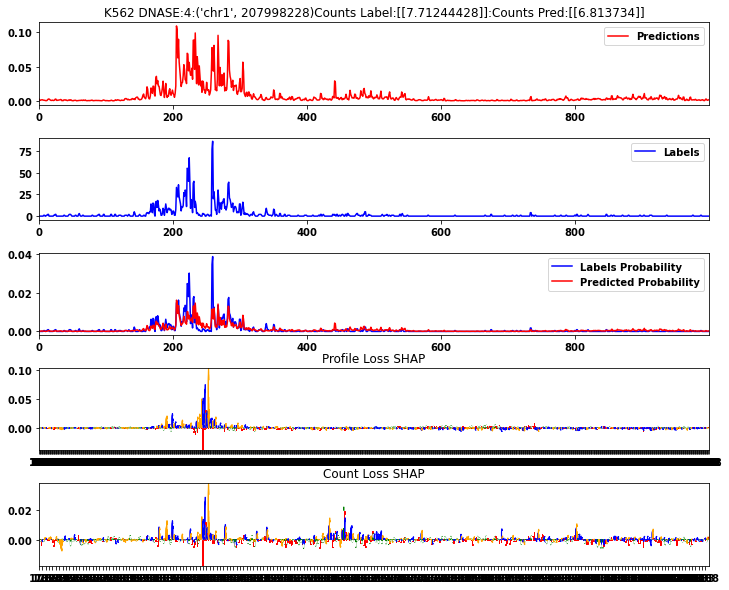

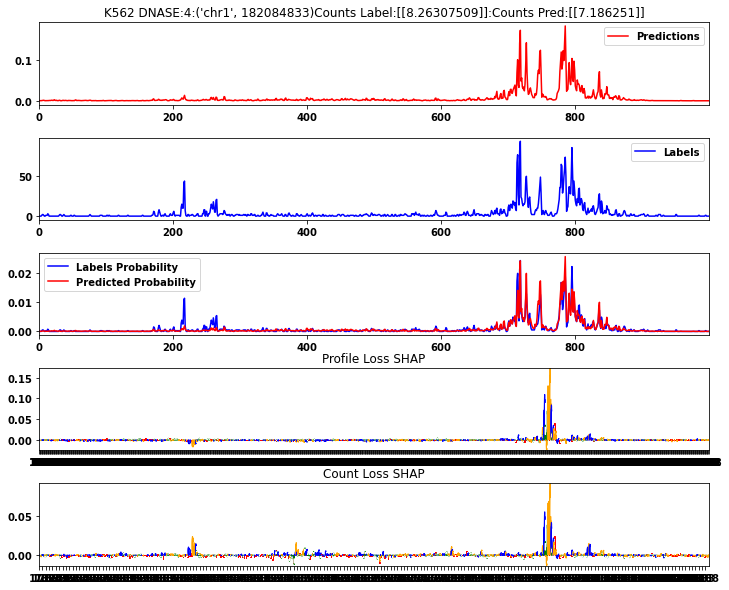

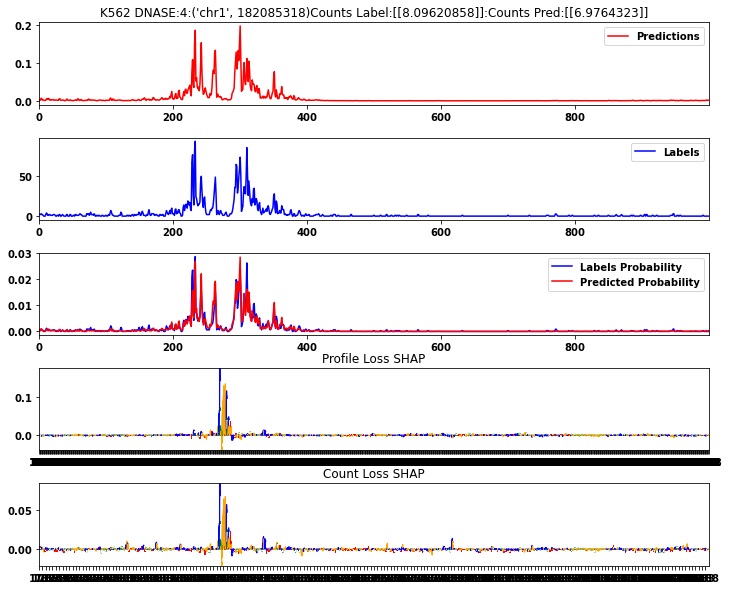

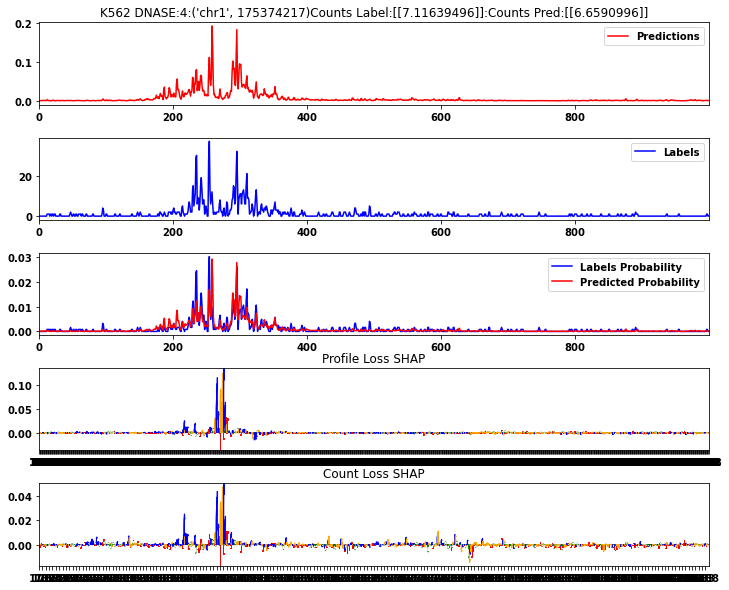

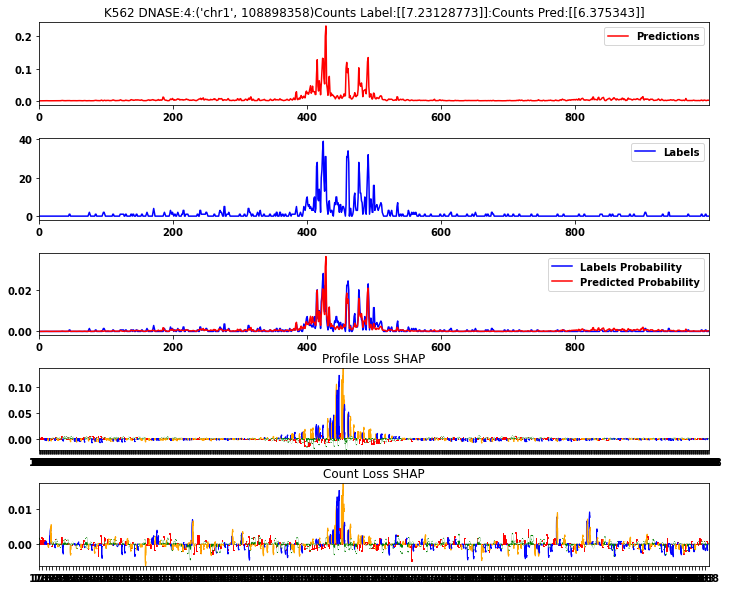

In [76]:
label_dict={} 
pred_dict={} 
profile_shap_dict={}
count_shap_dict={}
seq_dict={}
seq_dict_1kb={}
for fold in range(5):
    model=load_model("/srv/scratch/annashch/deeplearning/profile/k562_dnase/bpnet/seed.1234.cw.250.filters.500.naive.range.4.6.to.11.5/K562.profile.peaks.only.bpnet.withdups.1234seed.250counts."+str(fold)+".hdf5")
    model_wrapper=(model.input, model.layers[-1].output)
    count_explainer=shap.DeepExplainer(model_wrapper,data=create_background,combine_mult_and_diffref=combine_mult_and_diffref_1d)
    prof_explainer = create_explainer(model)
    for i in range(len(gen)): 
        X,y,coords=gen[i]
        coords=coords[0]
        preds=model.predict(X)
        pred_prob=softmax(preds[0].squeeze())
        pred_counts=pred_prob*(preds[1].squeeze()) 
        label_counts=y[0].squeeze()
        label_prob=label_counts/sum(label_counts)
        profile_explanations=prof_explainer(X[0])
        count_explanations=np.squeeze(count_explainer.shap_values(X)[0])
        plt.rcParams["figure.figsize"]=12,10
        fig, axes = plt.subplots(5, 1)
        axes[0].plot(pred_counts,label='Predictions',color='r')
        axes[1].plot(label_counts,label='Labels',color='b')
        axes[2].plot(label_prob,label="Labels Probability",color='b')
        axes[2].plot(pred_prob,label="Predicted Probability",color='r')    
        axes[0].set_title('K562 DNASE:'+str(fold)+":"+str(coords)+"Counts Label:"+str(y[1])+":"+"Counts Pred:"+str(preds[1]))
        axes[0].legend()
        axes[1].legend() 
        axes[2].legend()
        axes[3]=plot_seq_importance(profile_explanations,X[0].squeeze(),xlim=(173,1173),axes=axes[3])
        axes[3].set_title("Profile Loss SHAP")
        axes[4]=plot_seq_importance(count_explanations,X[0].squeeze(),xlim=(173,1173),axes=axes[4])
        axes[4].set_title("Count Loss SHAP")
        plt.subplots_adjust(hspace=0.4)
        plt.savefig("bpnet.K562.dnase.fold"+str(fold)+"."+coords[0]+'.'+str(coords[1])+'.svg',dpi=80,format="svg")
        if coords not in label_dict: 
            label_dict[coords]={} 
            pred_dict[coords]={}
            profile_shap_dict[coords]={}
            count_shap_dict[coords]={}
            seq_dict[coords]=X[0]
            seq_dict_1kb[coords]=X[0][173:1173]
        label_dict[coords][fold]=label_prob
        pred_dict[coords][fold]=pred_prob 
        profile_shap_dict[coords][fold]=profile_explanations 
        count_shap_dict[coords][fold]=count_explanations 
        
        

In [77]:
import pickle
outputs={} 
outputs['labels']=label_dict
outputs['preds']=pred_dict
outputs['seq']=seq_dict
outputs['seq_1kb']=seq_dict_1kb
outputs['profile_shap']=profile_shap_dict 
outputs['count_shap']=count_shap_dict 
pickle.dump( outputs,open( "region.deepshap.bpnet.p", "wb" ) )



In [4]:
fold=0
model=load_model("/srv/scratch/annashch/deeplearning/profile/k562_dnase/bpnet/seed.1234.cw.250.filters.500.naive.range.4.6.to.11.5/K562.profile.peaks.only.bpnet.withdups.1234seed.250counts."+str(fold)+".hdf5")


Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [8]:
X,y,coords=gen[19]

In [9]:
preds=model.predict(X)

In [10]:
#let's see if the model did well. 
print("counts label:"+str(y[1]))
print("counts prediction:"+str(preds[1]))

counts label:[[7.23128773]]
counts prediction:[[6.3410754]]


In [22]:
pred_prob=softmax(preds[0].squeeze())
pred_counts=pred_prob*(preds[1].squeeze()) 
label_counts=y[0].squeeze()
label_prob=label_counts/sum(label_counts)

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


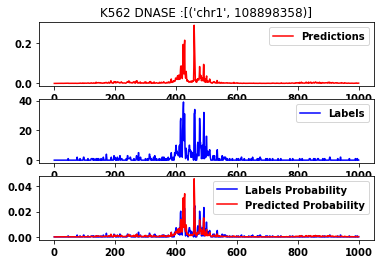

In [23]:
#plt.rcParams["figure.figsize"]=10,8
fig, axes = plt.subplots(3, 1)
axes[0].plot(pred_counts,label='Predictions',color='r')
axes[1].plot(label_counts,label='Labels',color='b')
axes[2].plot(label_prob,label="Labels Probability",color='b')
axes[2].plot(pred_prob,label="Predicted Probability",color='r')    
axes[0].set_title('K562 DNASE :'+str(coords))
axes[0].legend()
axes[1].legend() 
axes[2].legend()
#plt.show();

In [45]:
model_wrapper=(model.input, model.layers[-1].output)
explainer=shap.DeepExplainer(model_wrapper,data=create_background,combine_mult_and_diffref=combine_mult_and_diffref_1d)

In [53]:
count_loss_shap=np.squeeze(explainer.shap_values(X)[0])

In [58]:
profile_loss_shap=np.squeeze(prof_explainer(X[0]))


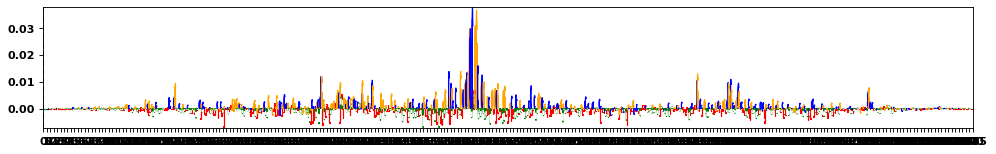

In [62]:
plot_seq_importance(count_loss_shap,X[0].squeeze(),figsize=(15,2))


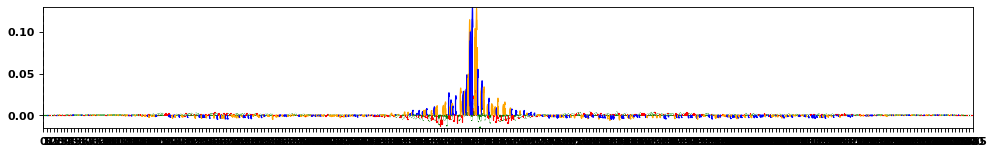

In [63]:
plot_seq_importance(profile_loss_shap,X[0].squeeze(),figsize=(15,2))
